# Setup

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from keras import ops
from keras_cv.layers import DropPath
from skimage.data import chelsea

2024-06-24 14:17:43.237297: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-06-24 14:17:43.237412: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-06-24 14:17:43.350839: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


# Configure the hyperparameters

In [ ]:
weight_decay = 0.0001
batch_size = 128
num_epochs = 10 
dropout_rate = 0.2
image_size = 256
patch_size = 8
num_patches = (image_size // patch_size) ** 2
embedding_dim = 256
num_blocks = 4
num_classes = 10
input_shape = (256, 256, 3)

print(f"Image size: {image_size} X {image_size} = {image_size ** 2}")
print(f"Patch size: {patch_size} X {patch_size} = {patch_size ** 2} ")
print(f"Patches per image: {num_patches}")
print(f"Elements per patch (3 channels): {(patch_size ** 2) * 3}")

Image size: 256 X 256 = 65536
Patch size: 8 X 8 = 64 
Patches per image: 1024
Elements per patch (3 channels): 192


# Prepare the data

In [ ]:
data_dir = 'photozilla'

In [ ]:
train_ds, val_ds = tf.keras.utils.image_dataset_from_directory(
    data_dir,
    label_mode='categorical',
    labels='inferred',
    image_size=(image_size, image_size),
    validation_split=0.2,
    subset="both",
    seed=1337,
    verbose=True
)

Found 100000 files belonging to 10 classes.
Using 80000 files for training.
Using 20000 files for validation.


# Build a classification model

In [ ]:
def build_classifier(blocks, positional_encoding=False):
    inputs = layers.Input(shape=input_shape)
    augmented = data_augmentation(inputs)
    patches = Patches(patch_size)(augmented)
    x = layers.Dense(units=embedding_dim)(patches)
    if positional_encoding:
        x = x + PositionEmbedding(sequence_length=num_patches)(x)
    x = blocks(x)
    representation = layers.GlobalAveragePooling1D()(x)
    representation = layers.Dropout(rate=dropout_rate)(representation)
    logits = layers.Dense(num_classes)(representation)
    return keras.Model(inputs=inputs, outputs=logits)

# Experiment function

In [ ]:
def run_experiment(model):
    optimizer = tf.keras.optimizers.AdamW(
        learning_rate=learning_rate,
        weight_decay=weight_decay,
    )
    model.compile(
        optimizer=optimizer,
        loss=tf.keras.losses.CategoricalCrossentropy(from_logits=True),
        metrics=[
            tf.keras.metrics.CategoricalAccuracy(name="acc"),
            tf.keras.metrics.TopKCategoricalAccuracy(5, name="top5-acc"),
        ],
    )

    reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(
        monitor="val_loss", factor=0.5, patience=5
    )

    early_stopping = tf.keras.callbacks.EarlyStopping(
        monitor="val_loss", patience=10, restore_best_weights=True
    )

    history = model.fit(
        train_ds,
        batch_size=batch_size,
        epochs=num_epochs,
        validation_data=val_ds,
        callbacks=[early_stopping, reduce_lr],
        verbose=1,
    )

    _, accuracy, top_5_accuracy = model.evaluate(val_ds)
    print(f"Test accuracy: {round(accuracy * 100, 2)}%")
    print(f"Test top 5 accuracy: {round(top_5_accuracy * 100, 2)}%")


    return history


# Data augmentation

In [ ]:
data_augmentation = tf.keras.Sequential(
    [
        layers.Normalization(),
        layers.Resizing(image_size, image_size),
        layers.RandomFlip("horizontal"),
        layers.RandomZoom(height_factor=0.2, width_factor=0.2),
    ],
    name="data_augmentation",
)

data_augmentation.layers[0].adapt(train_ds.map(lambda x, y: x))

# Patch extraction layer

In [ ]:
class Patches(layers.Layer):
    def __init__(self, patch_size, **kwargs):
        super().__init__(**kwargs)
        self.patch_size = patch_size

    def call(self, x):
        patches = keras.ops.image.extract_patches(x, self.patch_size)
        batch_size = keras.ops.shape(patches)[0]
        num_patches = keras.ops.shape(patches)[1] * keras.ops.shape(patches)[2]
        patch_dim = keras.ops.shape(patches)[3]
        out = keras.ops.reshape(patches, (batch_size, num_patches, patch_dim))
        return out

# Position embedding layer

In [ ]:
class PositionEmbedding(keras.layers.Layer):
    def __init__(
        self,
        sequence_length,
        initializer="glorot_uniform",
        **kwargs,
    ):
        super().__init__(**kwargs)
        if sequence_length is None:
            raise ValueError("`sequence_length` must be an Integer, received `None`.")
        self.sequence_length = int(sequence_length)
        self.initializer = keras.initializers.get(initializer)

    def get_config(self):
        config = super().get_config()
        config.update(
            {
                "sequence_length": self.sequence_length,
                "initializer": keras.initializers.serialize(self.initializer),
            }
        )
        return config

    def build(self, input_shape):
        feature_size = input_shape[-1]
        self.position_embeddings = self.add_weight(
            name="embeddings",
            shape=[self.sequence_length, feature_size],
            initializer=self.initializer,
            trainable=True,
        )

        super().build(input_shape)

    def call(self, inputs, start_index=0):
        shape = keras.ops.shape(inputs)
        feature_length = shape[-1]
        sequence_length = shape[-2]
        position_embeddings = keras.ops.convert_to_tensor(self.position_embeddings)
        position_embeddings = keras.ops.slice(
            position_embeddings,
            (start_index, 0),
            (sequence_length, feature_length),
        )
        return keras.ops.broadcast_to(position_embeddings, shape)

    def compute_output_shape(self, input_shape):
        return input_shape

# Helper functions

## Visualizing training progress

In [17]:
def plot_history(item, model_history):
    plt.plot(model_history.history[item], label=item)
    plt.plot(model_history.history["val_" + item], label="val_" + item)
    plt.xlabel("Epochs")
    plt.ylabel(item)
    plt.title("Train and Validation {} Over Epochs".format(item), fontsize=14)
    plt.legend()
    plt.grid()
    plt.show()

## Analyzing model performance 

In [11]:
def evaluate_models(models, test_ds, class_names, num_images=16, image_size=(224, 224)):
    # Iterate over the models
    for i, model in enumerate(models):
        # Get true labels
        y_test = np.concatenate([y for x, y in test_ds], axis=0)  # Concatenate all batches of labels
        y_test = np.argmax(y_test, axis=1)  # Assuming y_test is one-hot encoded

        # Get predictions
        predictions = model.predict(test_ds)
        
        # Convert predictions to class indices
        y_pred = np.argmax(predictions, axis=1)
        
        # Flatten arrays
        y_test = np.ravel(y_test)
        y_pred = np.ravel(y_pred)
        
        # Debug: Print lengths of y_test and y_pred
        print(f"Length of y_test: {len(y_test)}")
        print(f"Length of y_pred: {len(y_pred)}")

        if len(y_test) != len(y_pred):
            raise ValueError("The lengths of y_test and y_pred do not match.")
        
        # Create DataFrame for actual vs predicted
        df2 = pd.DataFrame({'Actual': y_test, 'Prediction': y_pred})
        print(df2.head())  # Debug: Print the first few rows of the DataFrame

        # Plot some sample images with their actual labels
        batch = next(iter(test_ds))
        images = batch[0]
        
        plt.figure(figsize=(20, 20))
        for n in range(num_images):
            plt.subplot(4, 4, n+1)
            plt.imshow(images[n].numpy().astype("uint8"))
            plt.axis('off')
            plt.title(class_names[int(y_test[n])], fontsize=25)
        
        plt.suptitle(f'Model {i+1} Predictions', fontsize=30)
        plt.show()

# MLP-Mixer model

## MLP-Mixer model builder

In [ ]:
class MLPMixerLayer(layers.Layer):
    def __init__(self, num_patches, hidden_units, dropout_rate, *args, **kwargs):
        super().__init__(*args, **kwargs)

        self.mlp1 = keras.Sequential(
            [
                layers.Dense(units=num_patches, activation="gelu"),
                layers.Dense(units=num_patches),
                layers.Dropout(rate=dropout_rate),
            ]
        )
        self.mlp2 = keras.Sequential(
            [
                layers.Dense(units=num_patches, activation="gelu"),
                layers.Dense(units=hidden_units),
                layers.Dropout(rate=dropout_rate),
            ]
        )
        self.normalize = layers.LayerNormalization(epsilon=1e-6)

    def build(self, input_shape):
        return super().build(input_shape)

    def call(self, inputs):
        x = self.normalize(inputs)
        x_channels = keras.ops.transpose(x, axes=(0, 2, 1))
        mlp1_outputs = self.mlp1(x_channels)
        mlp1_outputs = keras.ops.transpose(mlp1_outputs, axes=(0, 2, 1))
        x = mlp1_outputs + inputs
        x_patches = self.normalize(x)
        mlp2_outputs = self.mlp2(x_patches)
        x = x + mlp2_outputs
        return x

## Train and Evaluate MLP-Mixer

In [ ]:
mlpmixer_blocks = keras.Sequential(
    [MLPMixerLayer(num_patches, embedding_dim, dropout_rate) for _ in range(num_blocks)]
)
learning_rate = 0.005
mlpmixer_classifier = build_classifier(mlpmixer_blocks)
history_mlp = run_experiment(mlpmixer_classifier)

Epoch 1/10
2500/2500 ━━━━━━━━━━━━━━━━━━━━ 591s 231ms/step - acc: 0.4919 - loss: 3.0662 - top5-acc: 0.8717 - val_acc: 0.6952 - val_loss: 0.9590 - val_top5-acc: 0.9701 - learning_rate: 0.0050
Epoch 2/10
2500/2500 ━━━━━━━━━━━━━━━━━━━━ 578s 231ms/step - acc: 0.6746 - loss: 1.0337 - top5-acc: 0.9610 - val_acc: 0.7323 - val_loss: 1.1797 - val_top5-acc: 0.9690 - learning_rate: 0.0050
Epoch 3/10
2500/2500 ━━━━━━━━━━━━━━━━━━━━ 578s 231ms/step - acc: 0.7326 - loss: 0.8990 - top5-acc: 0.9727 - val_acc: 0.8227 - val_loss: 0.8107 - val_top5-acc: 0.9809 - learning_rate: 0.0050
Epoch 4/10
2500/2500 ━━━━━━━━━━━━━━━━━━━━ 578s 231ms/step - acc: 0.7832 - loss: 0.7804 - top5-acc: 0.9801 - val_acc: 0.8163 - val_loss: 0.9078 - val_top5-acc: 0.9724 - learning_rate: 0.0050
Epoch 5/10
2500/2500 ━━━━━━━━━━━━━━━━━━━━ 576s 230ms/step - acc: 0.8046 - loss: 0.7555 - top5-acc: 0.9815 - val_acc: 0.8120 - val_loss: 1.1060 - val_top5-acc: 0.9813 - learning_rate: 0.0050
Epoch 6/10
2500/2500 ━━━━━━━━━━━━━━━━━━━━ 578s 231

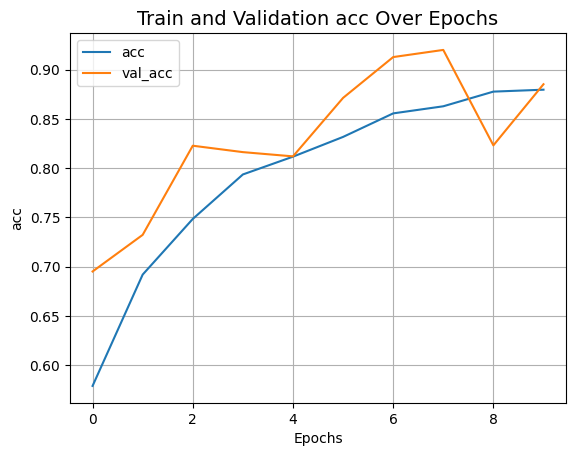

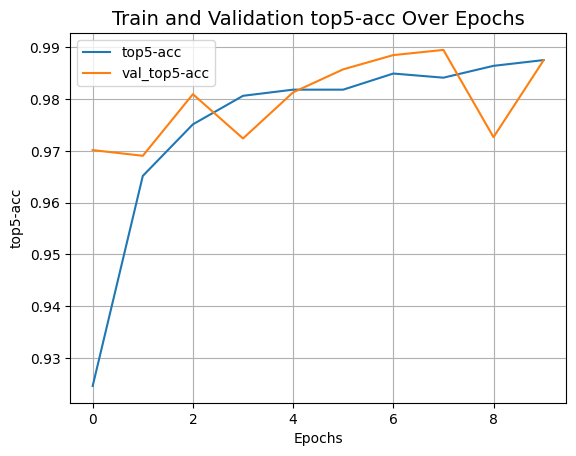

In [15]:
plot_history("acc", history_mlp)
plot_history("top5-acc", history_mlp)

## Visualizating the predictions from MLP-Mixer

625/625 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step
Length of y_test: 20000
Length of y_pred: 20000
   Actual  Prediction
0       4           4
1       9           9
2       5           5
3       6           6
4       9           5


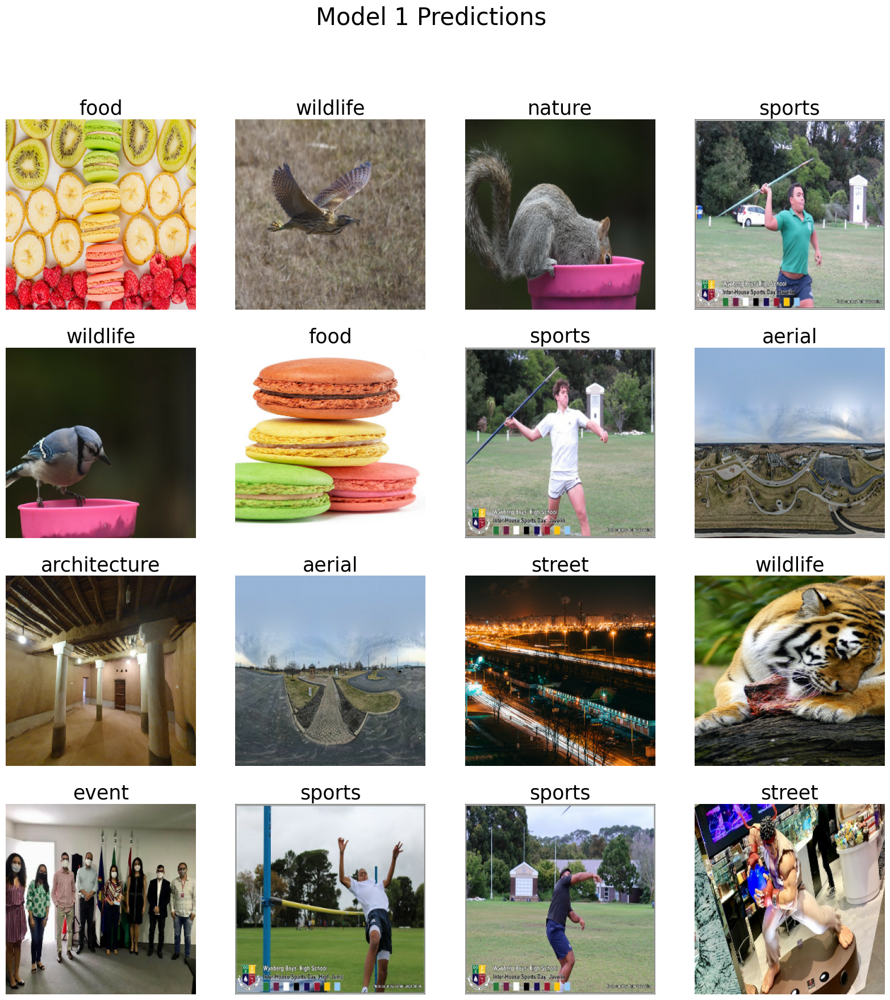

In [21]:
evaluate_models([mlpmixer_classifier], test_ds=val_ds, class_names=val_ds.class_names)

# FNet model

## FNet model builder

In [12]:
class FNetLayer(layers.Layer):
    def __init__(self, embedding_dim, dropout_rate, *args, **kwargs):
        super().__init__(*args, **kwargs)

        self.ffn = keras.Sequential(
            [
                layers.Dense(units=embedding_dim, activation="gelu"),
                layers.Dropout(rate=dropout_rate),
                layers.Dense(units=embedding_dim),
            ]
        )

        self.normalize1 = layers.LayerNormalization(epsilon=1e-6)
        self.normalize2 = layers.LayerNormalization(epsilon=1e-6)

    def call(self, inputs):
        real_part = inputs
        im_part = keras.ops.zeros_like(inputs)
        x = keras.ops.fft2((real_part, im_part))[0]
        x = x + inputs
        x = self.normalize1(x)
        x_ffn = self.ffn(x)
        x = x + x_ffn
        return self.normalize2(x)

## Train and Evaluate FNet model

In [13]:
fnet_blocks = keras.Sequential(
    [FNetLayer(embedding_dim, dropout_rate) for _ in range(num_blocks)]
)
learning_rate = 0.001
fnet_classifier = build_classifier(fnet_blocks, positional_encoding=True)
history_fnet = run_experiment(fnet_classifier)

Epoch 1/10
2500/2500 ━━━━━━━━━━━━━━━━━━━━ 280s 107ms/step - acc: 0.4851 - loss: 1.4847 - top5-acc: 0.8677 - val_acc: 0.7431 - val_loss: 0.7470 - val_top5-acc: 0.9833 - learning_rate: 0.0010
Epoch 2/10
2500/2500 ━━━━━━━━━━━━━━━━━━━━ 245s 98ms/step - acc: 0.7428 - loss: 0.7424 - top5-acc: 0.9801 - val_acc: 0.7610 - val_loss: 0.7234 - val_top5-acc: 0.9851 - learning_rate: 0.0010
Epoch 3/10
2500/2500 ━━━━━━━━━━━━━━━━━━━━ 246s 98ms/step - acc: 0.7940 - loss: 0.5948 - top5-acc: 0.9865 - val_acc: 0.8328 - val_loss: 0.5155 - val_top5-acc: 0.9901 - learning_rate: 0.0010
Epoch 4/10
2500/2500 ━━━━━━━━━━━━━━━━━━━━ 246s 98ms/step - acc: 0.8244 - loss: 0.5145 - top5-acc: 0.9885 - val_acc: 0.8415 - val_loss: 0.4681 - val_top5-acc: 0.9890 - learning_rate: 0.0010
Epoch 5/10
2500/2500 ━━━━━━━━━━━━━━━━━━━━ 246s 98ms/step - acc: 0.8468 - loss: 0.4534 - top5-acc: 0.9901 - val_acc: 0.8729 - val_loss: 0.3770 - val_top5-acc: 0.9913 - learning_rate: 0.0010
Epoch 6/10
2500/2500 ━━━━━━━━━━━━━━━━━━━━ 246s 98ms/st

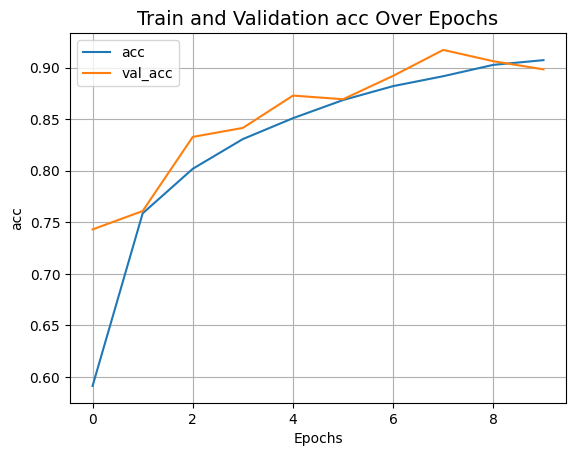

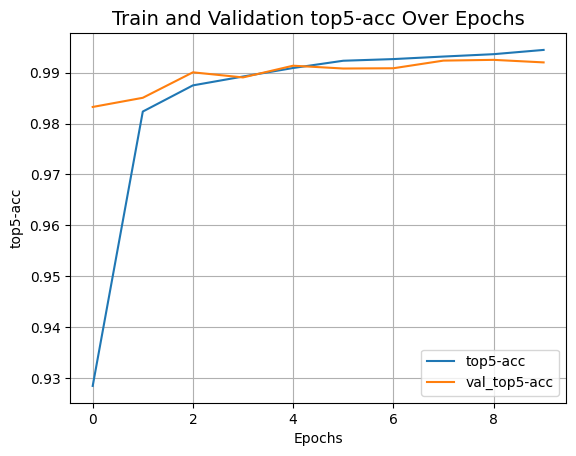

In [18]:
plot_history("acc", history_fnet)
plot_history("top5-acc", history_fnet)

## Visualizating the predictions from FNet

625/625 ━━━━━━━━━━━━━━━━━━━━ 20s 31ms/step
Length of y_test: 20000
Length of y_pred: 20000
   Actual  Prediction
0       4           4
1       9           9
2       5           5
3       6           6
4       9           5


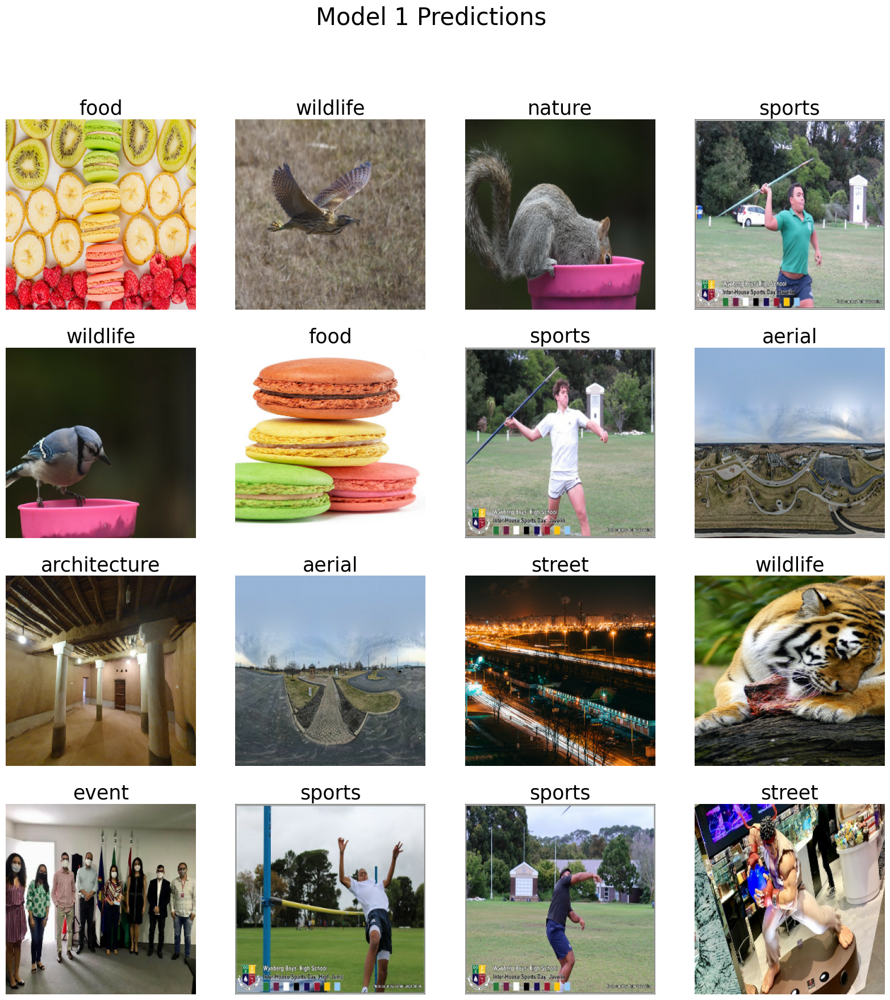

In [19]:
evaluate_models([fnet_classifier], test_ds=val_ds, class_names=val_ds.class_names)

# gMLP model

## gMLP model Builder

In [20]:
class gMLPLayer(layers.Layer):
    def __init__(self, num_patches, embedding_dim, dropout_rate, *args, **kwargs):
        super().__init__(*args, **kwargs)

        self.channel_projection1 = keras.Sequential(
            [
                layers.Dense(units=embedding_dim * 2, activation="gelu"),
                layers.Dropout(rate=dropout_rate),
            ]
        )

        self.channel_projection2 = layers.Dense(units=embedding_dim)

        self.spatial_projection = layers.Dense(
            units=num_patches, bias_initializer="Ones"
        )

        self.normalize1 = layers.LayerNormalization(epsilon=1e-6)
        self.normalize2 = layers.LayerNormalization(epsilon=1e-6)

    def spatial_gating_unit(self, x):
        u, v = keras.ops.split(x, indices_or_sections=2, axis=2)
        v = self.normalize2(v)
        v_channels = keras.ops.transpose(v, axes=(0, 2, 1))
        v_projected = self.spatial_projection(v_channels)
        v_projected = keras.ops.transpose(v_projected, axes=(0, 2, 1))
        return u * v_projected

    def call(self, inputs):
        x = self.normalize1(inputs)
        x_projected = self.channel_projection1(x)
        x_spatial = self.spatial_gating_unit(x_projected)
        x_projected = self.channel_projection2(x_spatial)
        return x + x_projected

## Train and Evaluate gMLP model

In [21]:
gmlp_blocks = keras.Sequential(
    [gMLPLayer(num_patches, embedding_dim, dropout_rate) for _ in range(num_blocks)]
)
learning_rate = 0.003
gmlp_classifier = build_classifier(gmlp_blocks)
history_gmlp = run_experiment(gmlp_classifier)

Epoch 1/10
2500/2500 ━━━━━━━━━━━━━━━━━━━━ 373s 146ms/step - acc: 0.6152 - loss: 1.1187 - top5-acc: 0.9288 - val_acc: 0.8497 - val_loss: 0.4787 - val_top5-acc: 0.9853 - learning_rate: 0.0030
Epoch 2/10
2500/2500 ━━━━━━━━━━━━━━━━━━━━ 363s 145ms/step - acc: 0.8500 - loss: 0.4742 - top5-acc: 0.9862 - val_acc: 0.9080 - val_loss: 0.3238 - val_top5-acc: 0.9886 - learning_rate: 0.0030
Epoch 3/10
2500/2500 ━━━━━━━━━━━━━━━━━━━━ 363s 145ms/step - acc: 0.8943 - loss: 0.3496 - top5-acc: 0.9902 - val_acc: 0.9283 - val_loss: 0.2599 - val_top5-acc: 0.9891 - learning_rate: 0.0030
Epoch 4/10
2500/2500 ━━━━━━━━━━━━━━━━━━━━ 363s 145ms/step - acc: 0.9132 - loss: 0.2911 - top5-acc: 0.9916 - val_acc: 0.9345 - val_loss: 0.2347 - val_top5-acc: 0.9912 - learning_rate: 0.0030
Epoch 5/10
2500/2500 ━━━━━━━━━━━━━━━━━━━━ 362s 145ms/step - acc: 0.9226 - loss: 0.2617 - top5-acc: 0.9930 - val_acc: 0.9365 - val_loss: 0.2369 - val_top5-acc: 0.9908 - learning_rate: 0.0030
Epoch 6/10
2500/2500 ━━━━━━━━━━━━━━━━━━━━ 364s 146

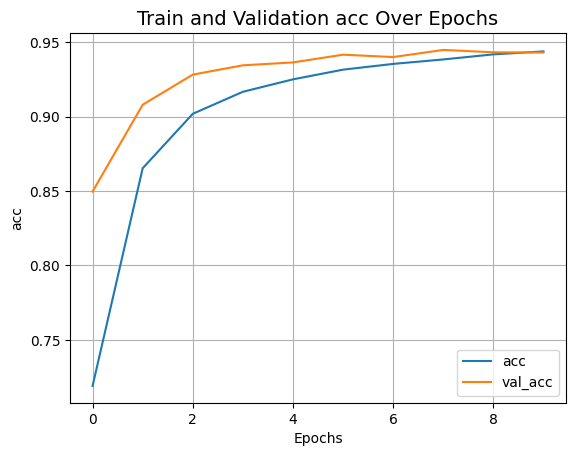

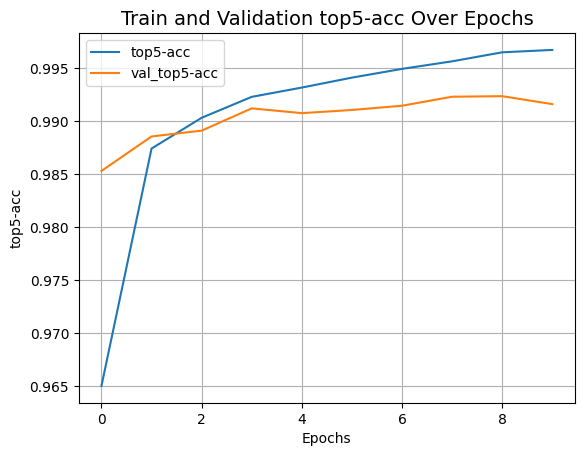

In [22]:
plot_history("acc", history_gmlp)
plot_history("top5-acc", history_gmlp)

## Visualizating the predictions from gMLP

625/625 ━━━━━━━━━━━━━━━━━━━━ 26s 40ms/step
Length of y_test: 20000
Length of y_pred: 20000
   Actual  Prediction
0       4           4
1       9           9
2       5           5
3       6           6
4       9           5


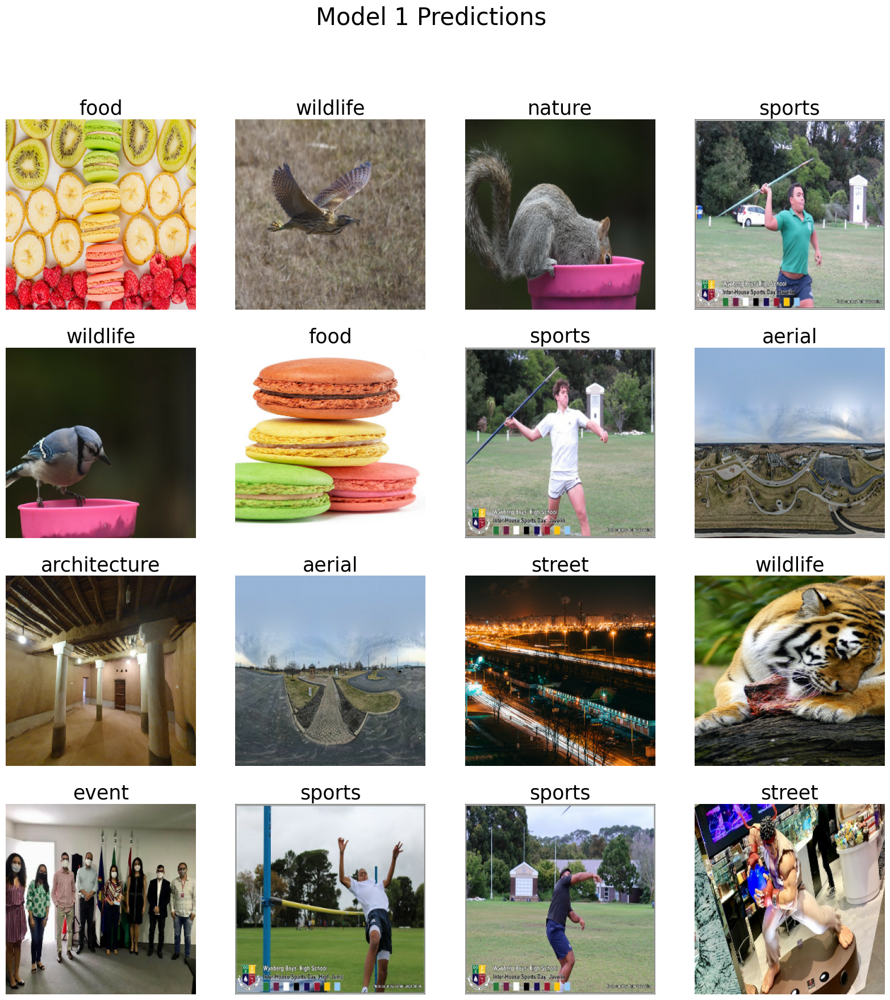

In [24]:
evaluate_models([gmlp_classifier], test_ds=val_ds, class_names=val_ds.class_names)